# import packges

In [5]:
library(DESeq2)
library(data.table)
library(dplyr)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(GSVA)
library(ggplot2)
library(gridExtra)
library(RColorBrewer)
library(IRdisplay)
library(GGally)
library(ChIPpeakAnno)
library(universalmotif)
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(kableExtra)
library(tidyverse)
library(ggraph)
library(tidygraph)
library(readxl)
library(corrplot)
library(ggrepel)
library(msigdbr)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
library(sva)
library(DT)
library(tools)
library(tidyverse)
library(RSQLite)

library(edgeR)

txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene

source('~/script/utils.r')
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/target/'
dir.create(base_dir)
setwd(base_dir)

PP = 'beat'


Warning message in dir.create(base_dir):
"'/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/target' already exists"


In [6]:
aml_genes = c('TET2',  'DNMT3A',  'SF3B1',  'TP53',  'PPM1D',  'ASXL1',  'NRAS', 
  'JAK2',  'GNB1',  'KRAS',  'CBL',  'IDH1',  'IDH2') 


# download bam files for RNASeq

In [6]:
dsn_all = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/GDCdata/TARGET-AML/manifest_rna_seq_transcriptome_gdc_realn_bam.tsv') 

In [ ]:
cd /research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML/GDCData 
singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/gdc-client_latest.sif gdc-client download -t \
~/gdc-user-token.2024-11-13T04_56_35.590Z.txt -m test.tsv


In [ ]:
cd /research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML
singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/gdc-client_latest.sif \
gdc-client download -t ~/gdc-user-token.2024-08-27T02_39_51.215Z.txt \ 
-m /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/GDCdata/TARGET-AML/manifest_rna_seq_transcriptome_gdc_realn_bam.tsv


# design table

In [ ]:
fwrite(dsn, file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML/GDCData/test.tsv')
dsn = dsn_all[1:99, ]

tail(dsn)
dim(dsn)
cd /research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML/GDCData
singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/gdc-client_latest.sif gdc-client download \
-t ~/gdc-user-token.2024-11-13T04_56_35.590Z.txt \
-m test.tsv

#/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/GDCdata/TARGET-AML/manifest_rna_seq_transcriptome_gdc_realn_bam.tsv

# -m  /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/GDCdata/TARGET-AML/test2.tsv
# /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/GDCdata/TARGET-AML/

dsn[, bam_ori_file := paste0('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML/GDCData/', id, '/', filename) ]
dsn[, sample_dir := paste0('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML/GDCData/', id, '/') ]
dsn[, sample_name := id ]
file.size(dsn$bam_ori_file)


In [ ]:
setwd('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML')
sub_dir = 'run_ii_jj'
#dir.create(sub_dir)
setwd(sub_dir)
system(paste0('cp ../programs/nextflow.config programs/te.nf programs/run.sh .') )

unlink('run.sh')

for( ii in 3:31 ){
    ii_start = ii * 100; ii_end = ii_start + 99

    dsn = dsn_all[ii_start:ii_end, ]
    dsn[, sample_dir   := file.path('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML/', sub_dir, 'data/', id) ]
    dsn[, bam_ori_file := paste0(sample_dir, '/', filename) ]
    dsn[, sample_name  := id ]

    meta_file = paste0('meta_', ii_start, '.file')
    ssheet_file = paste0('samplesheet_', ii_start, '.file')
    fwrite(dsn, file = meta_file, sep = '\t')
    fwrite(dsn[, .(sample_name, bam_ori_file)], file = ssheet_file )


    cmd = paste0('singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/gdc-client_latest.sif gdc-client download ')
    cmd = paste0(cmd, ' -t ~/gdc-user-token.2024-11-13T04_56_35.590Z.txt -d data -m ', meta_file)
    write(cmd, file = 'run.sh', append = T)

    write(paste0('\nnextflow run te.nf -profile singularity  --samplesheet ', ssheet_file), file = 'run.sh', append = T)
    
    write(paste0('\n'), file = 'run.sh', append = T) 
    
}


In [37]:
system(paste0('cp programs/nextflow.config programs/te.nf programs/run.sh .') 

system(paste0('cd ', sub_dir))
cmd = paste0('singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/gdc-client_latest.sif gdc-client download ')
cmd = paste0(cmd, ' -t ~/gdc-user-token.2024-11-13T04_56_35.590Z.txt -m meta.file')
write(cmd, file = 'run.sh', append = T)


# create TE nextflow pipeline

In [30]:
setwd('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML/')


In [31]:
# sample_name,bam_ori_file

In [ ]:
/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/TARGET_AML/

# sort bam file by name

In [32]:
proj_name = 'tgt'

In [34]:
dsn[, sorted_bam_file := paste0(sample_dir, sample_name, '_nameSorted.bam') ]

dsn[, sortBam_jobname := paste0('sortBam_', sample_name, '_', proj_name) ]
dsn[, sortBam_oo := paste0(sample_dir, sample_name, '_sortBam.out')]
dsn[, sortBam_er := paste0(sample_dir, sample_name, '_sortBam.err')]
dsn[, sortBam_cmd := paste0('bsub -J ', sortBam_jobname, ' -o ', sortBam_oo, ' -e ', sortBam_er)]
dsn[, sortBam_cmd := paste0(sortBam_cmd, ' -W 240:00 -n 15 -R "rusage[mem=5GB]" -R "span[hosts=1]" ')] 
dsn[, sortBam_cmd := paste0(sortBam_cmd, ' " singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/depot.galaxyproject.org-singularity-picard-3.0.0--hdfd78af_1.img ')]
dsn[, sortBam_cmd := paste0(sortBam_cmd, 'picard SortSam -I ', bam_ori_file, ' -O ', sorted_bam_file, ' -SORT_ORDER queryname " ') ]

write(dsn[, sortBam_cmd], file = 'run_sortbam.sh')


In [86]:
dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, sortBam_jobname := paste0('sortBam_', sample_name) ]
dsn[, sortBam_oo := paste0(sample_pre, '_sortBam.out')]
dsn[, sortBam_er := paste0(sample_pre, '_sortBam.err')]
dsn[, sortBam_cmd := paste0('bsub -J ', sortBam_jobname, ' -n 10 -o ', sortBam_oo, ' -e ', sortBam_er, ' -P beat -n 15 -R "rusage[mem=5GB]" ')]
dsn[, sortBam_cmd := paste0(sortBam_cmd, ' " samtools sort -o ', sorted_bam_file, ' -n -@ 14 ', bam_ori_file, '"') ]

write(dsn$sortBam_cmd, file = 'run_sortbam.sh')


In [14]:
# 25 bam files has EOF error 
dsn[, eof := F ]
dsn[file.size(sorted_bam_file) < 1000, eof := T] 


In [15]:
dim(dsn[eof == T, ])

[1] 25 15

# bam to fastq

In [85]:
dsn[, fq_1 := paste0(sample_pre, '_r1.fastq')]
dsn[, fq_2 := paste0(sample_pre, '_r2.fastq')]

dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, bam2fq_jobname := paste0('bam2fq_', sample_name) ]
dsn[, bam2fq_oo := paste0(sample_pre, '_bam2fq.out')]
dsn[, bam2fq_er := paste0(sample_pre, '_bam2fq.err')]
dsn[, bam2fq_cmd := paste0('bsub -J ', bam2fq_jobname, ' -n 10 -o ', bam2fq_oo, ' -e ', bam2fq_er, ' -P beat -n 2 -R "rusage[mem=5GB]" ')]
dsn[, bam2fq_cmd := paste0(bam2fq_cmd, ' " singularity exec /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/depot.galaxyproject.org-singularity-picard-3.0.0--hdfd78af_1.img ')]
dsn[, bam2fq_cmd := paste0(bam2fq_cmd, ' picard SamToFastq -INPUT ', sorted_bam_file, ' --FASTQ ', fq_1, ' --SECOND_END_FASTQ ', fq_2, '"') ]
write(dsn[eof == F, bam2fq_cmd], file = 'run_bam2fq.sh')


# compress fastq

In [82]:
dsn[, fq_1_gz := paste0(sample_pre, '_r1.fastq.gz')]
dsn[, fq_2_gz := paste0(sample_pre, '_r2.fastq.gz')]


In [83]:
dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, fq1_gzip_jobname := paste0('fq1_gzip_', sample_name) ]
dsn[, fq1_gzip_oo := paste0(sample_pre, '_fq1_gzip.out')]
dsn[, fq1_gzip_er := paste0(sample_pre, '_fq1_gzip.err')]
dsn[, fq1_gzip_cmd := paste0('bsub -J ', fq1_gzip_jobname, ' -n 10 -o ', fq1_gzip_oo, ' -e ', fq1_gzip_er, ' -P beat -n 2 -R "rusage[mem=5GB]" ')]
dsn[, fq1_gzip_cmd := paste0(fq1_gzip_cmd, ' " gzip ', fq_1, ' "')]
write(dsn[eof == F, fq1_gzip_cmd], file = 'run_fq1_gzip.sh')
dsn[1, fq1_gzip_cmd]


[1] "bsub -J fq1_gzip_2031_BA2501 -n 10 -o /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml/data/2031_BA2501/2031_BA2501_fq1_gzip.out -e /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml/data/2031_BA2501/2031_BA2501_fq1_gzip.err -P beat -n 2 -R \"rusage[mem=5GB]\"  \" gzip /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml/2031_BA2501/2031_BA2501_r1.fastq \""

In [84]:
dsn[, sorted_bam_file := paste0(sample_pre, '_nameSorted.bam') ]
dsn[, fq2_gzip_jobname := paste0('fq2_gzip_', sample_name) ]
dsn[, fq2_gzip_oo := paste0(sample_pre, '_fq2_gzip.out')]
dsn[, fq2_gzip_er := paste0(sample_pre, '_fq2_gzip.err')]
dsn[, fq2_gzip_cmd := paste0('bsub -J ', fq2_gzip_jobname, ' -n 10 -o ', fq2_gzip_oo, ' -e ', fq2_gzip_er, ' -P beat -n 2 -R "rusage[mem=5GB]" ')]
dsn[, fq2_gzip_cmd := paste0(fq2_gzip_cmd, ' " gzip ', fq_2, ' "')]
write(dsn[eof == F, fq2_gzip_cmd], file = 'run_fq2_gzip.sh')
dsn[1, fq2_gzip_cmd]


[1] "bsub -J fq2_gzip_2031_BA2501 -n 10 -o /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml/data/2031_BA2501/2031_BA2501_fq2_gzip.out -e /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml/data/2031_BA2501/2031_BA2501_fq2_gzip.err -P beat -n 2 -R \"rusage[mem=5GB]\"  \" gzip /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml/2031_BA2501/2031_BA2501_r2.fastq \""

In [20]:
dsn[duplicated(sample_name), ]

Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"
Warning message in cbind(parts$left, chars$ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"


bam_ori_file,sample_name,sample_name2,sample_pre,sample_dir,sorted_bam_file,validateBam_jobname,validateBam_oo,validateBam_er,validateBam_cmd,⋯,fq_1_gz,fq_2_gz,fq1_gzip_jobname,fq1_gzip_oo,fq1_gzip_er,fq1_gzip_cmd,fq2_gzip_jobname,fq2_gzip_oo,fq2_gzip_er,fq2_gzip_cmd
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>


In [21]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml"

# align

In [81]:
# module load star/2.7.10a
REFERENCE_GENOME="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF"
REFERENCE_GENOME_FASTA='/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.fa'
GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf"
TE_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf"


dsn[, star_jobname := paste0('star_', sample_name)]
dsn[, star_oo := paste0(sample_pre, 'star_out')]
dsn[, star_eo := paste0(sample_pre, 'star_err')]
dsn[, bam_prefix := paste0(sample_pre, '_')]
dsn[, bam_file := paste0(bam_prefix, 'Aligned.sortedByCoord.out.bam')]
#alignments/A549_0_1 Aligned.sortedByCoord.out.bam

dsn[, star_cmd := paste0('bsub -J ', star_jobname, ' -o ', star_oo, ' -e ', star_eo, ' -P ', PP, ' -n 30 -R "rusage[mem=5GB]" ')]
#dsn[, star_cmd := paste0(star_cmd, ' -w ', cutadapt_jobname)]
dsn[, star_cmd := paste0(star_cmd, ' -W 290')]
dsn[, star_cmd := paste0(star_cmd, ' " STAR --genomeDir ', REFERENCE_GENOME)] 
dsn[, star_cmd := paste0(star_cmd, ' --runThreadN 28 --outSAMtype BAM SortedByCoordinate --outFilterMultimapNmax 1000 --outSAMmultNmax 1 ')]
dsn[, star_cmd := paste0(star_cmd, ' --outFilterMismatchNmax 3 --outMultimapperOrder Random --winAnchorMultimapNmax 1000 --alignEndsType EndToEnd ')]
dsn[, star_cmd := paste0(star_cmd, ' --alignIntronMax 1 --alignMatesGapMax 350 --quantMode TranscriptomeSAM --readFilesIn ', fq_1, ' ', fq_2, ' ')]
#dsn[, star_cmd := paste0(star_cmd, ' --alignIntronMax 1 --alignMatesGapMax 350 --quantMode TranscriptomeSAM --readFilesIn ', fastq_r1_trimmed, ' ', fastq_r2_trimmed, ' ')]
dsn[, star_cmd := paste0(star_cmd, ' --readFilesCommand cat --outFileNamePrefix ', bam_prefix, '"')]

write(dsn[eof == F & file.size(bam_file) < 100000, star_cmd], file = paste0(base_dir, 'run_beat_star.sh'))

#STAR --genomeDir $REFERENCE_GENOME \
#                --runThreadN 28 --outSAMtype BAM SortedByCoordinate --outFilterMultimapNmax 1000 --outSAMmultNmax 1 \
#                --outFilterMismatchNmax 3 --outMultimapperOrder Random --winAnchorMultimapNmax 1000 --alignEndsType EndToEnd \
#                --alignIntronMax 1 --alignMatesGapMax 350 --quantMode TranscriptomeSAM --readFilesIn "$R1_FILE" "$R2_FILE" --readFilesCommand zcat \
#                --outFileNamePrefix "$OUTPUT_DIR/${SAMPLE_NAME}_"

In [23]:
length(dsn[eof == F & file.size(bam_file) < 100000, bam_file])
file.size(dsn[eof == F & file.size(bam_file) < 100000, bam_file])
dsn[eof == F & file.size(bam_file) < 100000, bam_file][1]

[1] 57

[1] 1099 1098 1098 1099 1097 1098 1099 1098    0 1098 1099 1097 1098    0    0
[16]    0 1097 1096    0    0    0    0 1098 1098    0 1097    0 1097 1097 1097
[31] 1098 1098 1098    0 1097 1098 1098 1099    0    0 1099 1097    0 1097    0
[46]    0 1098    0    0    0    0 1098    0    0    0 1097    0

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml/2005_BA2802/2005_BA2802_Aligned.sortedByCoord.out.bam"

# flagstat

In [68]:
dsn$sample_pre[1]

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml/2031_BA2501/2031_BA2501"

In [75]:
dsn$bam_ori_file[1]

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/YuxuanLiu/Data_Yuxuan/BEAT_AML/./AML_samples_bam_1/2031_BA2501/2031_BA2501.bqsr.bam"

In [71]:
dsn[, flagstat_jobname := paste0('flagstat_', sample_name)]
dsn[, flagstat_oo := paste0(sample_pre, 'flagstat_out')]
dsn[, flagstat_eo := paste0(sample_pre, 'flagstat_err')]
dsn[, flagstat_out := paste0(sample_pre, '_flagstat')]

dsn[, flagstat_cmd := paste0('bsub -J ', flagstat_jobname, ' -o ', flagstat_oo, ' -e ', flagstat_eo, ' -P ', PP, ' -n 30 -R "rusage[mem=5GB]"  ')]
dsn[, flagstat_cmd := paste0(flagstat_cmd, ' -R span[hosts=1] -W 1:00 ')]
dsn[, flagstat_cmd := paste0(flagstat_cmd, ' " samtools flagstat ', bam_ori_file, ' > ', flagstat_out, ' "')]

write(dsn[, flagstat_cmd], file = paste0(base_dir, 'run_flagstat.sh'))


In [72]:
dsn[, read_nn := {system(paste0('cat ', flagstat_out, ' | grep "total" | awk "{print $1}" '), intern = T)}, by = 1:nrow(dsn)]

# TEcount

In [93]:
dsn[, tecount_file := paste0(sample_dir, 'tecount.cntTable')]

GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf"
TE_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf"
bin_tecount = '/home/whu78/conda3/envs/te/bin/'

dsn[, tecount_jobname := paste0('tecount_', sample_name)]
dsn[, tecount_oo := paste0(sample_pre, '_tecount_out')]
dsn[, tecount_eo := paste0(sample_pre, '_tecount_err')]

dsn[, tecount_cmd := paste0('bsub -J ', tecount_jobname, ' -n 10 -o ', tecount_oo, ' -e ', tecount_eo, ' -P ', PP, ' -R "rusage[mem=5GB]" ')]
dsn[, tecount_cmd := paste0(tecount_cmd, ' -W 999:00')]
dsn[, tecount_cmd := paste0(tecount_cmd, ' " cd ', sample_dir, ' && ', bin_tecount, 'TEcount --sortByPos --format BAM --mode multi -b ', bam_file)] 
dsn[, tecount_cmd := paste0(tecount_cmd, ' --GTF ', GTF_FILE, ' --TE ', TE_GTF_FILE, ' --project tecount "')] 

write(dsn[eof == F & (!file.exists(tecount_file) | file.size(tecount_file) < 1000) & file.size(bam_file) > 10000, tecount_cmd], file = paste0(base_dir, 'run_beat_tecount.sh'))


In [26]:
nrow(dsn[eof == F & file.exists(tecount_file) & file.size(tecount_file) > 1000 & file.size(bam_file) > 10000, ])

[1] 380

# TElocal

In [94]:
GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf"
TE_GTF_FILE = '/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf'
TE_loc_GTF_FILE = '/research/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/T2T_CHM13_v2_rmsk_TE.gtf.locInd'

sif_telocal = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/telocal.sif'
bin_telocal = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/conda3/envs/snap/bin/'
exe_telocal = '/home/whu78/repos/TElocal/TElocal'
exe_telocal = '/home/whu78/conda3/envs/te/bin/TElocal'

dsn[, telocal_jobname := paste0('telocal_', sample_name)]
dsn[, telocal_oo := paste0(sample_pre, '_telocal_out')]
dsn[, telocal_eo := paste0(sample_pre, '_telocal_err')]

dsn[, telocal_cmd := paste0('bsub -J ', telocal_jobname, ' -n 10 -o ', telocal_oo, ' -e ', telocal_eo, ' -P ', PP, ' -R "rusage[mem=5GB]" ')]
dsn[, telocal_cmd := paste0(telocal_cmd, ' -W 999:00')]
dsn[, telocal_cmd := paste0(telocal_cmd, ' " cd ', sample_dir, ' && ', exe_telocal, ' --sortByPos -b ', bam_file)] 
dsn[, telocal_cmd := paste0(telocal_cmd, ' --GTF ', GTF_FILE, ' --TE ', TE_loc_GTF_FILE, ' --stranded reverse --project telocal "')] 

#write(dsn[, telocal_cmd], file = paste0(base_dir, 'run_beat_telocal.sh'))
write(dsn[eof == F & (!file.exists(tecount_file) | file.size(tecount_file) < 1000) & file.size(bam_file) > 10000, telocal_cmd], file = paste0(base_dir, 'run_beat_telocal.sh'))


In [28]:
dsn[, telocal_file := paste0(sample_dir, 'telocal.cntTable')]


In [29]:
sum(file.exists(dsn[eof == F, tecount_file]))
sum(file.exists(dsn[eof == F, telocal_file]))

sum(file.exists(dsn[eof == F, tecount_file]) & file.size(dsn[eof == F, tecount_file]) > 1000)


[1] 380

[1] 380

[1] 380

In [30]:
dsn_sel = dsn[eof == F & file.size(tecount_file) > 1000, ]
dim(dsn_sel)


[1] 380  47

In [87]:
fwrite(dsn, file = 'dsn_beataml_batch1_Sep4.tsv') 

In [78]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml"

# read tecount file

In [31]:
count_list = lapply(dsn_sel[, tecount_file], function(fname){
    tmp = fread(fname)
    sname = sub('_Aligned.sortedByCoord.out.bam', '', basename(colnames(tmp)[2]))
    setnames(tmp, 1, 'gene') 
    setnames(tmp, 2, 'value')
    tmp
})
names(count_list) = dsn_sel[, sample_name]
count_dt = rbindlist(count_list, idcol = T)
count_dt = dcast(formula = gene ~ .id, value.var = 'value', count_dt) 
count_df = setDF(count_dt[, 2:ncol(count_dt)], rownames = count_dt$gene)
head(count_df)
saveRDS(count_df, file = 'beataml_count_df_tecount.rds')


,2000_BA2123,2003_BA2499,2004_BA2846,2008_BA2676,2010_BA2304,2014_BA2226,2015_BA2861,2016_BA2816,2018_BA2950,2019_BA2905,⋯,2577_BA2944,2578_BA3043,2580_BA3042,2582_BA3049,2583_BA3051,2587_BA3059,2591_BA3067,2591_BA3068,2592_BA3070,2592_BA3072
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
(CATTC)n:Satellite:Satellite,1,0,0,0,0,2,0,0,0,2,⋯,0,0,0,0,7,4,0,0,0,0
(GAATG)n:Satellite:Satellite,1,5,0,22,1,11,2,8,15,31,⋯,5,9,6,6,20,24,6,3,4,4
7SLRNA:srpRNA:srpRNA,2,2,2,1,0,9,3,0,1,2,⋯,1,5,1,3,6,3,4,2,1,3
A-rich:Low_complexity:Low_complexity,2,0,3,0,0,0,1,0,1,2,⋯,1,0,0,0,0,0,1,2,0,0
A1BG,112,151,90,114,151,392,137,336,222,173,⋯,307,94,407,58,35,47,328,246,73,144
A1BG-AS1,47,38,136,130,164,315,126,248,134,68,⋯,222,110,239,49,37,20,232,270,86,152


In [32]:
count_te_df = readRDS('beataml_count_df_tecount.rds')

In [33]:
length(count_list)

[1] 380

In [34]:
head(count_df)


,2000_BA2123,2003_BA2499,2004_BA2846,2008_BA2676,2010_BA2304,2014_BA2226,2015_BA2861,2016_BA2816,2018_BA2950,2019_BA2905,⋯,2577_BA2944,2578_BA3043,2580_BA3042,2582_BA3049,2583_BA3051,2587_BA3059,2591_BA3067,2591_BA3068,2592_BA3070,2592_BA3072
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
(CATTC)n:Satellite:Satellite,1,0,0,0,0,2,0,0,0,2,⋯,0,0,0,0,7,4,0,0,0,0
(GAATG)n:Satellite:Satellite,1,5,0,22,1,11,2,8,15,31,⋯,5,9,6,6,20,24,6,3,4,4
7SLRNA:srpRNA:srpRNA,2,2,2,1,0,9,3,0,1,2,⋯,1,5,1,3,6,3,4,2,1,3
A-rich:Low_complexity:Low_complexity,2,0,3,0,0,0,1,0,1,2,⋯,1,0,0,0,0,0,1,2,0,0
A1BG,112,151,90,114,151,392,137,336,222,173,⋯,307,94,407,58,35,47,328,246,73,144
A1BG-AS1,47,38,136,130,164,315,126,248,134,68,⋯,222,110,239,49,37,20,232,270,86,152


# cpm tecount

In [35]:
coding_genes = read.table('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/coding_gene_list', header = F)$V1
count_df_coding = count_df[rownames(count_df) %in% coding_genes, ] 
count_df_te     = count_df[!(rownames(count_df) %in% coding_genes), ] 


In [36]:
dge <- DGEList(count_df_coding)
dge <- calcNormFactors(dge)
logcpm_beat_coding = cpm(dge, normalized.lib.sizes = T, log = T)


In [37]:
dge <- DGEList(count_df_te)
dge <- calcNormFactors(dge)
logcpm_beat_te = cpm(dge, normalized.lib.sizes = T, log = T)


In [38]:
logcpm_beat_te[1:3, 1:10]

,2000_BA2123,2003_BA2499,2004_BA2846,2008_BA2676,2010_BA2304,2014_BA2226,2015_BA2861,2016_BA2816,2018_BA2950,2019_BA2905
(CATTC)n:Satellite:Satellite,-0.1485415,-0.8973748,-0.8973748,-0.8973748,-0.8973748,-0.04424902,-0.8973748,-0.8973748,-0.8973748,0.03456199
(GAATG)n:Satellite:Satellite,-0.1485415,1.2166389,-0.8973748,2.8367010,0.3705019,1.54497368,0.8235474,1.0583034,1.3275759,3.01637159
7SLRNA:srpRNA:srpRNA,0.3419418,0.3239305,0.3773198,-0.2563900,-0.8973748,1.31327818,1.2547132,-0.8973748,-0.5812330,0.03456199


In [39]:
dim(dge)

[1] 1310  380

In [40]:
tmp = as.data.table(t(logcpm_beat_te), keep.rownames = T)
tmp[, rn := sub('.*_', '', rn) ]
#tmp[, rn := substr(rn , 1, 6) ]
tmp[1:3, 1:10]

rn,(CATTC)n:Satellite:Satellite,(GAATG)n:Satellite:Satellite,7SLRNA:srpRNA:srpRNA,A-rich:Low_complexity:Low_complexity,ACRO1:acro:Satellite,ALR/Alpha:centr:Satellite,Alu-VAR_rnd-5_family-1084:Alu:SINE,Alu:Alu:SINE,AluJb:Alu:SINE
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BA2123,-0.1485415,-0.1485415,0.3419418,0.3419418,0.3419418,6.783020,-0.8973748,8.824984,16.57364
BA2499,-0.8973748,1.2166389,0.3239305,-0.8973748,0.6863194,5.796549,-0.8973748,8.646976,16.28241
BA2846,-0.8973748,-0.8973748,0.3773198,0.7484255,1.4972567,7.975200,-0.8973748,8.549631,16.21563


In [41]:
logcpm_beat_t[, rn2 := substr(rn, 1, 6) ]

ERROR: Error in eval(expr, envir, enclos): object 'logcpm_beat_t' not found


In [21]:
logcpm_beat_t = merge(logcpm_beat_t, tmp, by.x = 'rn2', by.y = 'rn')
dim(logcpm_beat_t)

[1]   359 18929

In [23]:
dim(dsn)
dim(dsn_sel)

[1] 462  47

[1] 380  47

In [24]:
# including coding and TE genes, clinical data has a better version in the molecular subtype analysis
saveRDS(logcpm_beat_t, file = 'logcpm_beat_coding_te_t.rds')

In [42]:
saveRDS(coding_genes, file = 'coding_genes.rds')
saveRDS(count_df_coding, file = 'tecount_df_coding.rds')
saveRDS(count_df_te, file = 'tecount_df_te.rds')   


# read telocal file


In [43]:
all(file.exists(dsn_sel$telocal_file))

[1] TRUE

In [44]:
dsn_sel[, telocal_file_size := file.size(telocal_file)]

In [48]:
telocal_list = lapply(dsn_sel[, telocal_file], function (fname) {
    tmp = fread(fname)
    setnames(tmp, 1, 'gene')
    setnames(tmp, 2, 'count')
    tmp
})
names(telocal_list) = dsn_sel[, sample_name]
telocal_dt = rbindlist(telocal_list, idcol = T)
telocal_dt[, .id := sub('.*_', '', .id) ]
telocal_dt = telocal_dt[! (gene %in% coding_genes), ]
telocal_dt[, tag := paste0(.id, '_', gene)]


Warning message in fread(fname):
"Previous fread() session was not cleaned up properly. Cleaned up ok at the beginning of this fread() call."


In [ ]:
telocal_dt[, nn := sum(.SD$count), by = 'tag' ]
telocal_dt_cnt380 = telocal_dt[nn > 380, ]
dim(telocal_dt_cnt380)


In [ ]:
head(telocal_dt)
dim(telocal_dt)

In [ ]:
count_dt = dcast(formula = gene ~ .id, value.var = 'count', data = telocal_dt) 
count_df = setDF(count_dt[, 2:ncol(count_dt)], rownames = count_dt$gene)
head(count_df)


In [ ]:
row_sum = rowSums(count_df)


In [ ]:
summary(row_sum)

In [ ]:
source('~/script/utils.r')

In [ ]:
ggdensity(row_sum) 

In [ ]:
# filter low expression loci
dim(count_df[row_sum > 380 * 3, ])
count_df_2 = count_df[row_sum > 380 * 3, ]


In [ ]:
count_df_3 = count_df_2[!(rownames(count_df_2) %in% coding_genes), ]


In [ ]:
# filter out low SD 
dge = DGEList(counts = count_df_3, group = NULL)
dge = calcNormFactors(dge)
dge = normLibSizes(dge)
logcpm = cpm(dge, log = T)


In [ ]:
dim(logcpm)

In [ ]:
row_sd = rowSds(logcpm) 


In [ ]:
summary(row_sd)
ggdensity(row_sd)


In [ ]:
count_df_4 = count_df_3[row_sd > 1.5, ]
dim(count_df_4)
head(count_df_4)


In [ ]:
telocal_df = copy(count_df_4)
rm(count_df_4, count_df_3, count_df_2, count_df)

In [ ]:
dim(logcpm[row_sd > 2, ])

In [ ]:
# filter telocal
# make small table to get the family & class information separately for filtering with the deg_te_dt_sel
telocal_df_meta = data.table(gene = rownames(telocal_df))
telocal_df_meta[, class_id := unlist(strsplit(gene, ':'))[4], by = 1:nrow(telocal_df_meta)]
telocal_df_meta[, family_id:= unlist(strsplit(gene, ':'))[3], by = 1:nrow(telocal_df_meta)]
telocal_df_meta[, sub_family_id := unlist(strsplit(gene, ':'))[2], by = 1:nrow(telocal_df_meta)]
telocal_df_meta[, gene_id  := unlist(strsplit(gene, ':'))[1], by = 1:nrow(telocal_df_meta)]
telocal_df_meta[, nn := length(unlist(strsplit(gene, ':'))), by = 1:nrow(telocal_df_meta)]
head(telocal_df_meta) 


In [ ]:
table(telocal_df_meta$class_id)


In [ ]:
# filter out low SD 
dge = DGEList(counts = telocal_df, group = NULL)
dge = calcNormFactors(dge)
dge = normLibSizes(dge)
logcpm_beataml_telocal = cpm(dge, log = T)


In [ ]:
saveRDS(logcpm_beataml_telocal, file = 'logcpm_beataml_telocal.rds') 
saveRDS(telocal_df, file = 'beataml_telocal_df.rds') 

In [ ]:
logcpm_beataml_telocal = readRDS(file = 'logcpm_beataml_telocal.rds') 
telocal_df = readRDS(file = 'beataml_telocal_df.rds')

# CMP related TE signature score

In [149]:
head(deg_MEPCMP)

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_MEP_EB,Ricksha_c:MULE-MuDR:DNA,-1.794502,9.671313,3.537422e-15,3.855790e-12,MEP,EB,DNA,MULE-MuDR,Ricksha_c
deg_MEP_EB,MER4-int:ERV1:LTR,1.552194,10.178204,8.196779e-12,4.467245e-09,MEP,EB,LTR,ERV1,MER4-int
deg_MEP_EB,HERV1_I:ERV1:LTR,-4.016606,8.909953,1.601935e-11,5.820362e-09,MEP,EB,LTR,ERV1,HERV1_I
deg_MEP_EB,MER1B:hAT-Charlie:DNA,-1.311878,11.324185,1.354780e-10,3.691776e-08,MEP,EB,DNA,hAT-Charlie,MER1B
deg_MEP_EB,MER92C:ERV1:LTR,6.102215,4.219076,1.113748e-09,2.011836e-07,MEP,EB,LTR,ERV1,MER92C
deg_MEP_EB,MER31-int:ERV1:LTR,1.827139,9.028825,1.243251e-09,2.011836e-07,MEP,EB,LTR,ERV1,MER31-int


In [207]:
sel = unique(deg_MEPCMP[batch == 'CMP' & logFC > 2 & FDR < 0.01, ])
table(sel$class_id)



 DNA LINE  LTR 
  17    4   23 

In [208]:
sel = unique(deg_MEPCMP[batch == 'CMP' & logFC > 2 & FDR < 0.01 & class_id %in% c('DNA', 'LTR'), rn])
length(sel)

gsva_res = gsva(expr = logcpm_beat_te, list(CMP_up = sel))
gsva_res = as.data.table(t(gsva_res), keep.rownames = T)
head(gsva_res)


[1] 39

Warning message in .filterFeatures(expr, method):
"12 genes with constant expression values throuhgout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 1 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



rn,CMP_up
<chr>,<dbl>
2000_BA2123,-0.08036397
2003_BA2499,0.26527169
2004_BA2846,-0.23520033
2008_BA2676,-0.14893675
2010_BA2304,-0.01655322
2014_BA2226,-0.05986381


In [209]:
setnames(gsva_res, 'CMP_up', 'CMP_dn_LTR_DNA') 
gsva_res[, dbgap_id := sub('_.*', '', rn) ]
gsva_res[, rnaseq_id:= sub('.*_', '', rn) ]
logcpm_beat_t_2= merge(logcpm_beat_t, gsva_res[, .(rnaseq_id, CMP_dn_LTR_DNA)], by.x = 'rn2', by.y = 'rnaseq_id')
tail2(logcpm_beat_t_2)


teucerv2_3edge:Unknown:Unknown,teucerv3_internal:Unknown:Unknown,relapse_LTR_UP,CMP_dn_LTR_DNA.x,lvl,CMP_dn_LTR_DNA.y
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
6.413226,-0.06159675,-0.02520708,-0.14783536,low,-0.14783536
7.012904,-0.01837146,0.37121286,0.25099435,hi,0.25099435
7.824462,0.60311330,-0.59817373,-0.21096334,low,-0.21096334
7.054691,1.21496140,-0.36407600,-0.02528668,low,-0.02528668


In [213]:
logcpm_beat_t_2[, CMP_dn_LTR_DNA.x := NULL ]


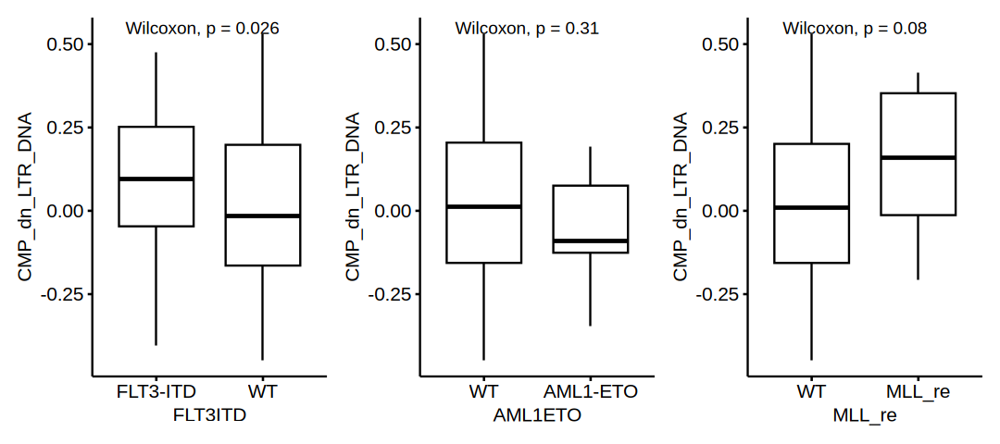

In [203]:
options(repr.plot.width = 9, repr.plot.height = 4, repr.plo.res = 300)
ggboxplot(plotdat, x = 'FLT3ITD', y = 'CMP_dn_LTR_DNA' ) + stat_compare_means() | 
ggboxplot(plotdat, x = 'AML1ETO', y = 'CMP_dn_LTR_DNA' ) + stat_compare_means() |
ggboxplot(plotdat, x = 'MLL_re',  y = 'CMP_dn_LTR_DNA' )  + stat_compare_means()
#ggboxplot(logcpm_beat_t, x = 'MLL_re', y = 'relapse', add = 'dotplot', add.params = list(color = 'grey', alpha = 0.5)) + stat_compare_means() 


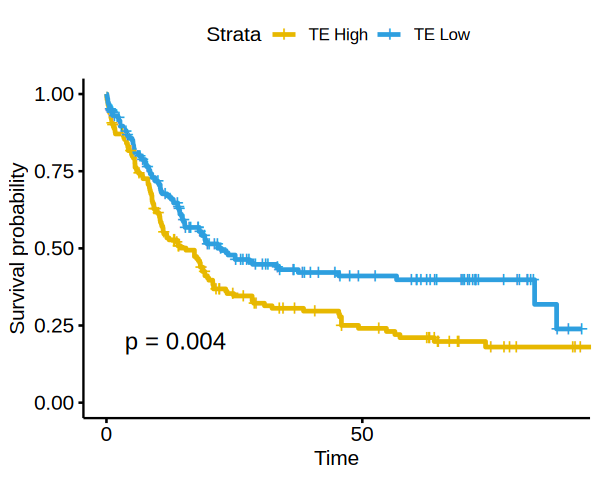

In [204]:
plotdat[, OS_STATUS := as.numeric(OS_STATUS) ]
plotdat[, lvl := 'low' ]
plotdat[CMP_dn_LTR_DNA > mean(plotdat$CMP_dn_LTR_DNA, na.rm = T), lvl := 'hi' ]
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat,
           size = 1,                 # change line size
           palette =  c("#E7B800", "#2E9FDF"),# custom color palettes
           pval = TRUE,              # Add p-value
           legend.labs =  c("TE High", "TE Low"),    # Change legend labels
           ggtheme = theme_pubr(), xlim = c(0, 90))      # Change ggplot2 theme



In [ ]:
plotdat

In [206]:
dim(plotdat)

[1]   359 18932

In [205]:
logcpm_beat_t = copy(plotdat)

# CMP related TElocal signature score

In [181]:
table(deg_telocal_MEPCMP[batch == 'CMP' & logFC > 2 & FDR < 0.01, class_id])



 DNA LINE  LTR SINE 
 340 4012  662  352 

In [178]:
sel = unique(deg_telocal_MEPCMP[batch == 'CMP' & logFC > 2 & FDR < 0.01 & class_id == 'LTR', rn])
length(sel)


[1] 662

In [182]:
plotdat = gsva(expr = logcpm_beat_, list(CMP_up = sel))
plotdat = as.data.table(t(plotdat), keep.rownames = T)
head(plotdat)


Warning message in .filterFeatures(expr, method):
"12 genes with constant expression values throuhgout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


ERROR: Error in .mapGeneSetsToFeatures(gset.idx.list, rownames(expr)): No identifiers in the gene sets could be matched to the identifiers in the expression data.


# relapse signature score

In [99]:
tecount_relapse_sel_LTR_up_id = tecount_relapse_sel[class_id == 'LTR' & logFC < 0, rn]
tecount_relapse_sel_LTR_up_id


[1] "MER34B-int:ERV1:LTR"  "MER61F:ERV1:LTR"      "LTR12C:ERV1:LTR"     
[4] "MER57F:ERV1:LTR"      "LTR54:ERV1:LTR"       "MamGypLTR4:Gypsy:LTR"
[7] "LTR7Y:ERV1:LTR"       "HERV30-int:ERV1:LTR"  "HERV9NC-int:ERV1:LTR"

In [100]:
plotdat = gsva(expr = logcpm_beat_te, list(relapse_LTR_UP = tecount_relapse_sel_LTR_up_id))
plotdat = as.data.table(t(plotdat), keep.rownames = T)
head(plotdat)


Warning message in .filterFeatures(expr, method):
"12 genes with constant expression values throuhgout the samples."
Warning message in .filterFeatures(expr, method):
"Since argument method!="ssgsea", genes with constant expression values are discarded."


Estimating GSVA scores for 1 gene sets.
Estimating ECDFs with Gaussian kernels
  |======================================================================| 100%



rn,relapse_LTR_UP
<chr>,<dbl>
2000_BA2123,-0.44322427
2003_BA2499,-0.25674422
2004_BA2846,-0.15109353
2008_BA2676,-0.01008534
2010_BA2304,0.70360443
2014_BA2226,0.24979191


In [101]:
plotdat[, dbgap_id := sub('_.*', '', rn) ]
plotdat[, rnaseq_id:= sub('.*_', '', rn) ]
head(plotdat)

rn,relapse_LTR_UP,dbgap_id,rnaseq_id
<chr>,<dbl>,<chr>,<chr>
2000_BA2123,-0.44322427,2000,BA2123
2003_BA2499,-0.25674422,2003,BA2499
2004_BA2846,-0.15109353,2004,BA2846
2008_BA2676,-0.01008534,2008,BA2676
2010_BA2304,0.70360443,2010,BA2304
2014_BA2226,0.24979191,2014,BA2226


In [102]:
logcpm_beat_t = merge(logcpm_beat_t, plotdat[, .(rnaseq_id, relapse_LTR_UP)], by.x = 'rn2', by.y = 'rnaseq_id')
logcpm_beat_t[1:3, 1:10]

rn2,rn,UBE2Q2P2,HMGB1P1,RNU12-2P,EFCAB8,SDR16C6P,HSPB1P1,PPBPP1,GTPBP6
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BA2000,BA2000R,0.02926131,0.4846250,0.18884637,0.1122339,0,0.1122339,0,3.915470
BA2003,BA2003R,0.90268049,0.4228661,0.03690553,0.3191444,0,0.2034060,0,4.137656
BA2011,BA2011R,0.70116448,0.3463987,0.17241135,1.5996898,0,0.1069691,0,4.180953


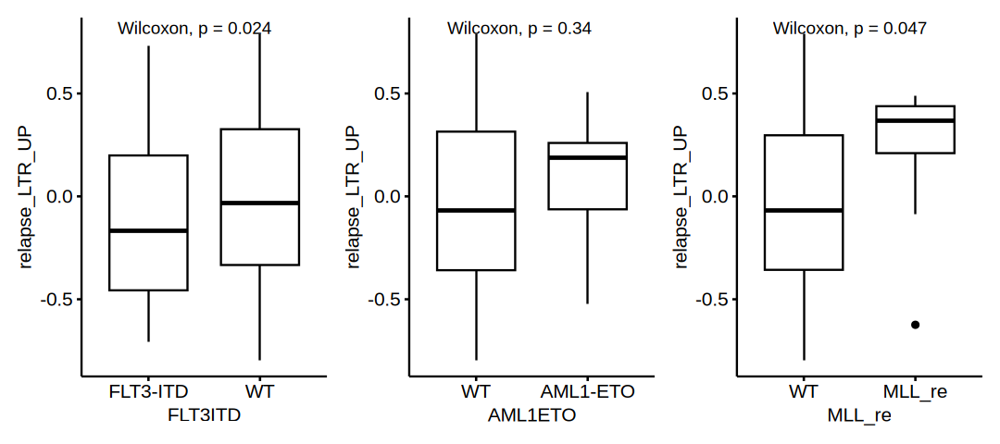

In [103]:
options(repr.plot.width = 9, repr.plot.height = 4, repr.plo.res = 300)
ggboxplot(logcpm_beat_t, x = 'FLT3ITD', y = 'relapse_LTR_UP' ) + stat_compare_means() | 
ggboxplot(logcpm_beat_t, x = 'AML1ETO', y = 'relapse_LTR_UP' ) + stat_compare_means() |
ggboxplot(logcpm_beat_t, x = 'MLL_re',  y = 'relapse_LTR_UP' )  + stat_compare_means()
#ggboxplot(logcpm_beat_t, x = 'MLL_re', y = 'relapse', add = 'dotplot', add.params = list(color = 'grey', alpha = 0.5)) + stat_compare_means() 


In [94]:
library(survminer)
library(survival)


Attaching package: 'survival'


The following object is masked from 'package:survminer':

    myeloma




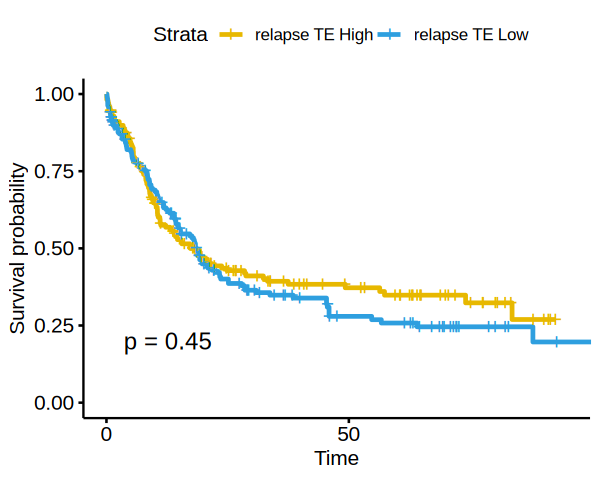

In [104]:
plotdat = logcpm_beat_t[, .(relapse_LTR_UP, BCAT1, OS_MONTHS, OS_STATUS)]
plotdat[, OS_STATUS := as.numeric(OS_STATUS) ]
plotdat[, lvl := 'low' ]
plotdat[relapse_LTR_UP > mean(plotdat$relapse_LTR_UP, na.rm = T), lvl := 'hi' ]
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat,
           size = 1,                 # change line size
           palette =  c("#E7B800", "#2E9FDF"),# custom color palettes
           pval = TRUE,              # Add p-value
           legend.labs =  c("relapse TE High", "relapse TE Low"),    # Change legend labels
           ggtheme = theme_pubr(), xlim = c(0, 95))      # Change ggplot2 theme



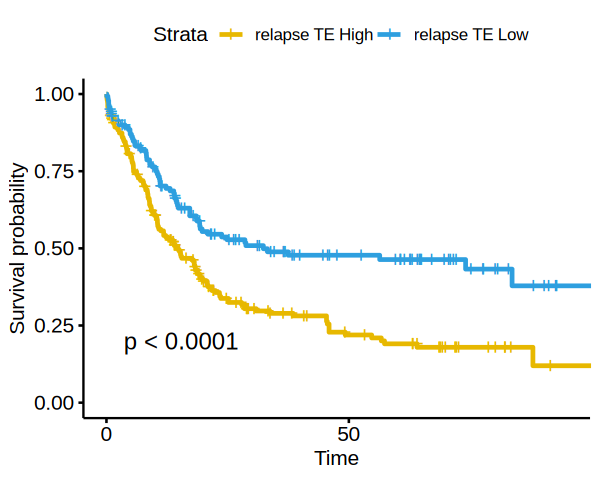

In [96]:
plotdat = logcpm_beat_t[, .(relapse_LTR_UP, BCAT1, OS_MONTHS, OS_STATUS)]
plotdat[, OS_STATUS := as.numeric(OS_STATUS) ]
plotdat[, lvl := 'low' ]
plotdat[BCAT1 > mean(plotdat$BCAT1, na.rm = T), lvl := 'hi' ]
fit <- survfit(Surv(OS_MONTHS, OS_STATUS) ~ lvl, data = plotdat)
options(repr.plot.width = 5, repr.plot.height = 4, repr.plo.res = 300)
ggsurvplot(fit, data = plotdat,
           size = 1,                 # change line size
           palette =  c("#E7B800", "#2E9FDF"),# custom color palettes
           pval = TRUE,              # Add p-value
           legend.labs =  c("relapse TE High", "relapse TE Low"),    # Change legend labels
           ggtheme = theme_pubr(), xlim = c(0, 95))      # Change ggplot2 theme



# molecular subtypes and TE expression DEG

In [57]:
beat_clin = fread(file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/data/beat_clin_beatAug13.tsv')
dim(beat_clin)
head(beat_clin) 
# '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat'
 

[1] 942 118

dbgap_subject_id,dbgap_dnaseq_sample,dbgap_rnaseq_sample,cohort,used_manuscript_analyses,manuscript_dnaseq,manuscript_rnaseq,manuscript_inhibitor,consensus_sex,inferred_sex,⋯,TP53_mut,PPM1D_mut,ASXL1_mut,NRAS_mut,JAK2_mut,GNB1_mut,KRAS_mut,CBL_mut,IDH1_mut,IDH2_mut
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2476,BA2102D,,Waves1+2,yes,yes,no,no,Female,Female,⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,WT
2476,BA2005D,,Waves1+2,no,no,no,no,Female,Male,⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,WT
2476,BA3074D,,Waves1+2,no,no,no,no,Female,Male,⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,WT
2476,BA2555D,,Waves1+2,no,no,no,no,Female,Female,⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,WT
2476,,BA3073R,Waves1+2,no,no,no,no,Female,,⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,WT
2157,BA2452D,BA2452R,Both,no,no,no,no,Male,Male,⋯,WT,WT,WT,WT,WT,WT,WT,WT,WT,WT


In [58]:
beat_clin[, idd := paste0(dbgap_subject_id, '_', sub('R$', '', dbgap_rnaseq_sample)) ]

In [59]:
head2(count_df_te)

,2000_BA2123,2003_BA2499,2004_BA2846,2008_BA2676,2010_BA2304
,<int>,<int>,<int>,<int>,<int>
(CATTC)n:Satellite:Satellite,1,0,0,0,0
(GAATG)n:Satellite:Satellite,1,5,0,22,1
7SLRNA:srpRNA:srpRNA,2,2,2,1,0


In [60]:
head(dsn$sample_name)

[1] "2031_BA2501" "2032_BA2348" "2077_BA2344" "2005_BA2802" "2017_BA2156"
[6] "2066_BA2066"

In [62]:
dsn_clin = merge(beat_clin, dsn, by.y = 'sample_name', by.x = 'idd', all.x = T)

In [63]:
dsn_clin_sel = dsn_clin[idd %in% colnames(count_df_te), ]
dsn_clin_sel_df = setDF(dsn_clin_sel, rownames = dsn$idd)
dim(dsn)

[1] 462  47

In [64]:
table(dsn_clin_sel_df$karyotype)


Altered  Normal 
    272     108 

In [ ]:
#gene_sel = setdiff(aml_genes, c( c('TP53', 'PPM1D', 'ASXL1', 'JAK2', 'GNB1', 'KRAS', 'CBL', 'IDH1'))) 
gene_sel = c('TET2', 'DNMT3A', 'SF3B1', 'NRAS', 'IDH2')
deg_mut_gene = lapply(gene_sel, function(gene){
    message(gene)
    gene_mut = paste0(gene, '_mut')
    dsn_sel = dsn_clin_sel_df[dsn_clin_sel_df$karyotype == 'Normal', ]
    dsn_sel$group = 'WT'
    dsn_sel$group[dsn_sel[, gene_mut] != 'WT'] = 'mut'
    dsn_sel$group = factor(dsn_sel$group, levels = c('WT', 'mut'))
    mtx = count_df_te[, rownames(dsn_sel) ] 
    deg_fun2(dsn_sel, mtx)
})
names(deg_mut_gene) = gene_sel

In [ ]:
#gene_sel = setdiff(aml_genes, c( c('TP53', 'PPM1D', 'ASXL1', 'JAK2', 'GNB1', 'KRAS', 'CBL', 'IDH1'))) 
#gene_sel = c('TET2', 'DNMT3A', 'SF3B1', 'NRAS', 'IDH2')
mut_sel = c('AML1ETO',  'MLL_re',  'FLT3ITD',  'PMLRARA',  'CBFBMYH11',  'GATA2MECOM')
mut_sel = c('AML1ETO',  'MLL_re',  'FLT3ITD',  'PMLRARA',  'CBFBMYH11',  'GATA2MECOM')
deg_fus_gene = lapply(mut_sel, function(mut){
    message(mut)
    dsn1 = dsn_df[dsn_df$karyotype == 'Normal', ]
    dsn2 = dsn_df[dsn_df[, mut] != 'WT', ]
    dsn1 = dsn1[!(rownames(dsn1) %in% rownames(dsn2)), ]
    dsn1$group = 'WT'
    dsn2$group = 'mut'
    dsn_sel = rbind(dsn1, dsn2) 
    dsn_sel$group = factor(dsn_sel$group, levels = c('WT', 'mut'))
    mtx = count_df_te[, rownames(dsn_sel) ] 
    deg_fun2(dsn_sel, mtx)
})
names(deg_fus_gene) = mut_sel

In [ ]:
deg_mut = c(deg_mut_gene, deg_fus_gene)
deg_mut_dt = rbindlist(deg_mut, idcol = T)
head(deg_mut_dt)


In [ ]:
saveRDS(deg_mut_dt, file = 'deg_mut_dt.rds')


In [ ]:
getwd()

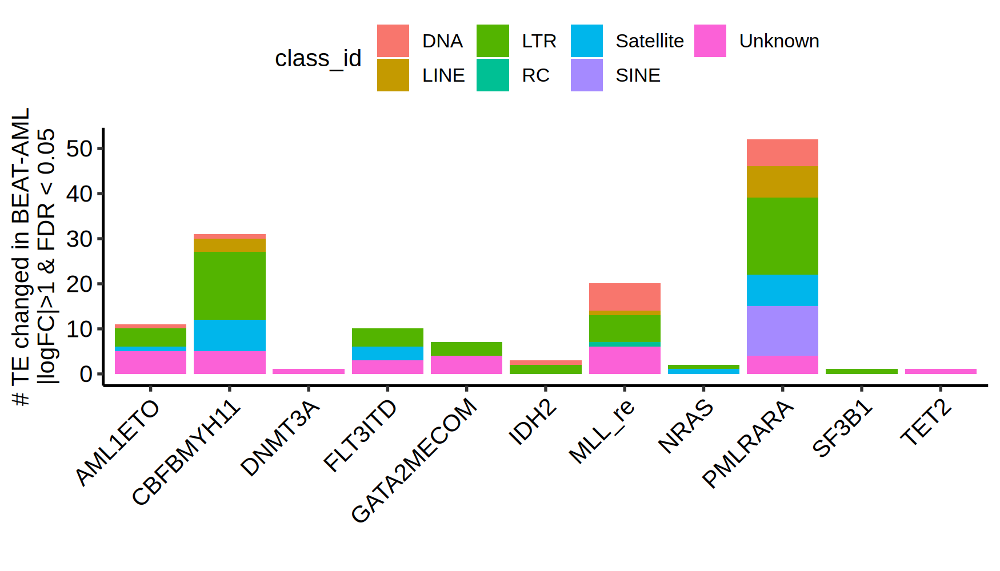

In [338]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 250)
plotdat = deg_mut_dt[FDR < 0.05 & abs(logFC) > 1, ]
plotdat[, class_id := unlist(strsplit(rn, ':'))[3], by = 1:nrow(plotdat)]
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 250)
ggplot(plotdat, aes(x = .id, fill = class_id)) + geom_bar() + theme_pubr() + theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1)) + 
xlab('') + ylab('# TE changed in BEAT-AML\n|logFC|>1 & FDR < 0.05')

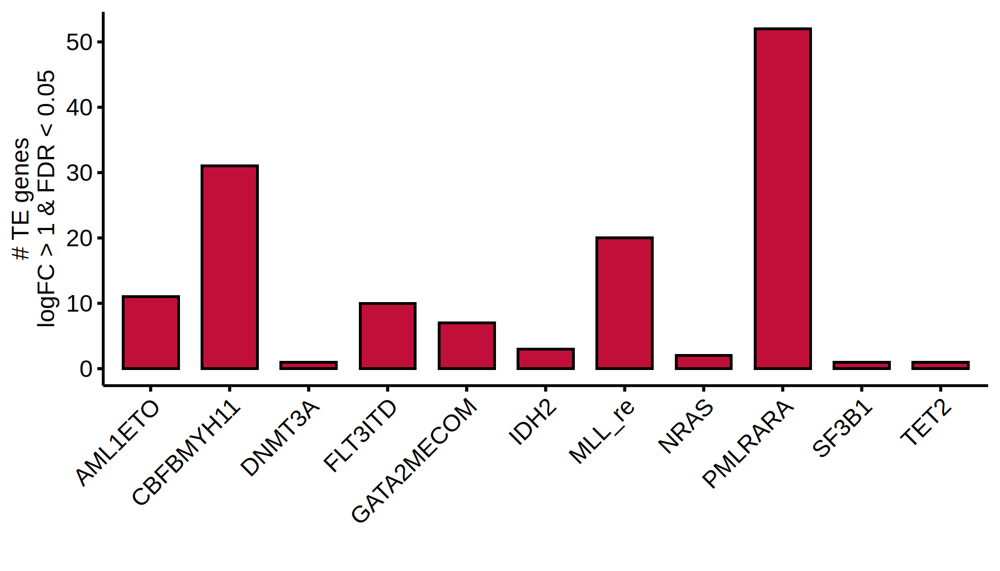

In [325]:
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 250)
plotdat = as.data.table(table(deg_mut_dt[FDR < 0.05 & abs(logFC) > 1, .id]), keep.rownames = T)
ggbarplot(plotdat, x = 'V1', y = 'N', fill = '#C10F3A') + theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust = 1)) +
ylab('# TE genes\nlogFC > 1 & FDR < 0.05') + xlab('')


In [6]:
saveRDS(deg_mut_dt, file = 'deg_mut_dt.rds')

ERROR: Error in eval(expr, envir, enclos): object 'deg_mut_dt' not found


In [326]:
head(plotdat)

V1,N
<chr>,<int>
AML1ETO,11
CBFBMYH11,31
DNMT3A,1
FLT3ITD,10
GATA2MECOM,7
IDH2,3


In [296]:
head(plotdat)

.id,rn,logFC,logCPM,PValue,FDR,logFDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TET2,UCON94:Unknown:Unknown,2.224827,3.246108,2.520644e-06,3.302044e-03,2.481217
DNMT3A,SAT_rnd-1_family-152:Unknown:Unknown,4.134914,2.546314,1.348128e-13,1.766048e-10,9.752997
SF3B1,LTR38-int:ERV1:LTR,2.304521,3.280185,1.994506e-07,2.612802e-04,3.582893
NRAS,HERV1_LTRd:ERV1:LTR,2.270096,3.710383,2.809469e-07,1.840202e-04,3.735134
NRAS,(GAATG)n:Satellite:Satellite,2.439854,1.928655,1.580706e-04,4.323629e-02,1.364152
IDH2,Tigger12:TcMar-Tigger:DNA,1.531672,7.293824,7.212341e-17,9.448167e-14,13.024652


In [317]:
head(plotdat)

.id,rn,logFC,logCPM,PValue,FDR,logFDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TET2,UCON94:Unknown:Unknown,2.224827,3.246108,2.520644e-06,3.302044e-03,2.481217
DNMT3A,SAT_rnd-1_family-152:Unknown:Unknown,4.134914,2.546314,1.348128e-13,1.766048e-10,9.752997
SF3B1,LTR38-int:ERV1:LTR,2.304521,3.280185,1.994506e-07,2.612802e-04,3.582893
NRAS,HERV1_LTRd:ERV1:LTR,2.270096,3.710383,2.809469e-07,1.840202e-04,3.735134
NRAS,(GAATG)n:Satellite:Satellite,2.439854,1.928655,1.580706e-04,4.323629e-02,1.364152
IDH2,Tigger12:TcMar-Tigger:DNA,1.531672,7.293824,7.212341e-17,9.448167e-14,13.024652


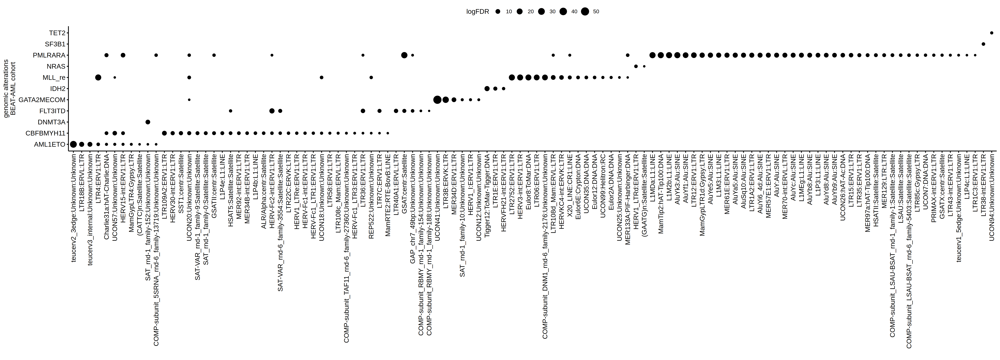

In [324]:
plotdat = deg_mut_dt[FDR < 0.05 & abs(logFC) > 1, ]
plotdat[, logFDR := -log(FDR, 10) ]
options(repr.plot.width = 25, repr.plot.height = 9, repr.plot.res = 250)
ggdotchart(plotdat, y = '.id', x = 'rn', fill = 'logFC', size = 'logFDR') + xlab('') + ylab('genomic alterations\nBEAT-AML cohort')

In [263]:
table(dsn$PMLRARA)


PML-RARA       WT 
      13      367 

In [340]:
col_sel = c('AML1ETO',  'MLL_re',  'FLT3ITD',  'CBFBMYH11',  'GATA2MECOM',  'PMLRARA', 
  'karyotype',  'TET2_mut',  'DNMT3A_mut',  'SF3B1_mut',  'NRAS_mut',  'IDH2_mut') 


In [345]:
dsn_df$subtype = unlist(apply(dsn_df[, col_sel], 1, function(xx){paste(unique(xx), collapse = '_')}))

In [ ]:
1:3

The automatically generated colors map from the minus and plus 99^th of
the absolute values in the matrix. There are outliers in the matrix
whose patterns might be hidden by this color mapping. You can manually
set the color to `col` argument.

Use `suppressMessages()` to turn off this message.



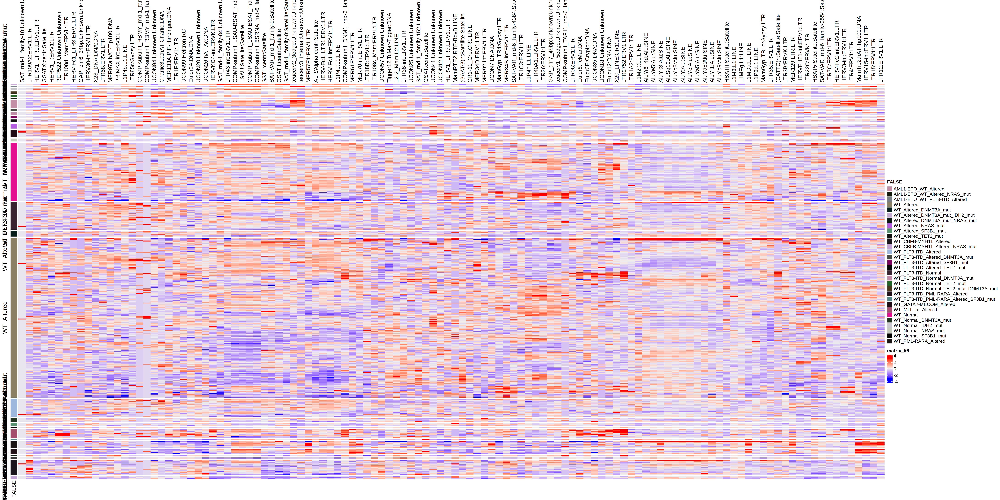

In [358]:
rn_sel = unique(deg_mut_dt[FDR < 0.1 & abs(logFC) > 1, rn])
plotdat = logcpm_beat_te[rn_sel, rownames(dsn_df)]
plotdat = scale_fun(plotdat)
mut_sel = c('AML1ETO',  'MLL_re',  'FLT3ITD',  'PMLRARA',  'CBFBMYH11',  'GATA2MECOM', 'karyotype')
gene_mut = paste0(c('TET2', 'DNMT3A', 'SF3B1', 'NRAS', 'IDH2'), '_mut')
#column_ha = HeatmapAnnotation(df = dsn_df[, c(mut_sel, gene_mut)])
options(repr.plot.width = 30, repr.plot.height = 15, repr.plot.res = 250)
row_ha = rowAnnotation(df = dsn_df[, 'subtype', drop = F], annotation_label = F)
#Heatmap(t(plotdat), top_annotation = column_ha, row_names_gp = grid::gpar(fontsize = 7), show_row_names = T, show_column_names = F, show_column_dend = F, show_row_dend = F)
Heatmap(t(plotdat), left_annotation = row_ha, row_names_gp = grid::gpar(fontsize = 9), show_row_names = F, show_column_names = T, 
        show_column_dend = F, show_row_dend = F, column_names_side = 'top', row_split = dsn_df$subtype)


In [352]:
rn_sel = unique(deg_mut_dt[FDR < 0.1 & abs(logFC) > 1, rn])
plotdat = logcpm_beat_te[rn_sel, rownames(dsn_df)]
plotdat = scale_fun(plotdat)
mut_sel = c('AML1ETO',  'MLL_re',  'FLT3ITD',  'PMLRARA',  'CBFBMYH11',  'GATA2MECOM', 'karyotype')
gene_mut = paste0(c('TET2', 'DNMT3A', 'SF3B1', 'NRAS', 'IDH2'), '_mut')
#column_ha = HeatmapAnnotation(df = dsn_df[, c(mut_sel, gene_mut)])
options(repr.plot.width = 30, repr.plot.height = 75, repr.plot.res = 250)
row_ha = rowAnnotation(df = dsn_df[, 'subtype', drop = F] )
#Heatmap(t(plotdat), top_annotation = column_ha, row_names_gp = grid::gpar(fontsize = 7), show_row_names = T, show_column_names = F, show_column_dend = F, show_row_dend = F)
Heatmap(t(plotdat), left_annotation = row_ha, row_names_gp = grid::gpar(fontsize = 9), show_row_names = F, show_column_names = T, 
        show_column_dend = F, show_row_dend = F, column_names_side = 'top', row_split = dsn_df$subtype)


The automatically generated colors map from the minus and plus 99^th of
the absolute values in the matrix. There are outliers in the matrix
whose patterns might be hidden by this color mapping. You can manually
set the color to `col` argument.

Use `suppressMessages()` to turn off this message.



The automatically generated colors map from the minus and plus 99^th of
the absolute values in the matrix. There are outliers in the matrix
whose patterns might be hidden by this color mapping. You can manually
set the color to `col` argument.

Use `suppressMessages()` to turn off this message.



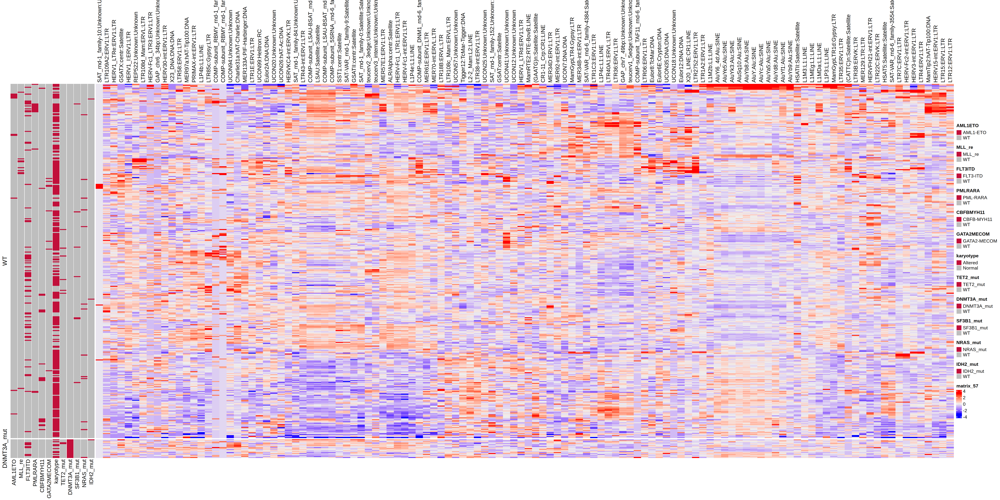

In [359]:
rn_sel = unique(deg_mut_dt[FDR < 0.1 & abs(logFC) > 1, rn])
plotdat = logcpm_beat_te[rn_sel, rownames(dsn_df)]
plotdat = scale_fun(plotdat)
mut_sel = c('AML1ETO',  'MLL_re',  'FLT3ITD',  'PMLRARA',  'CBFBMYH11',  'GATA2MECOM', 'karyotype')
gene_mut = paste0(c('TET2', 'DNMT3A', 'SF3B1', 'NRAS', 'IDH2'), '_mut')
#column_ha = HeatmapAnnotation(df = dsn_df[, c(mut_sel, gene_mut)])
row_ha = rowAnnotation(df = dsn_df[, c(mut_sel, gene_mut)], 
                       col = list(AML1ETO = c('WT' = 'grey', 'AML1-ETO' = '#C10F3A'),
                                  MLL_re  = c('WT' = 'grey', 'MLL_re'   = '#C10F3A'),
                                  FLT3ITD = c('WT' = 'grey', 'FLT3-ITD'   = '#C10F3A'), 
                                  CBFBMYH11 = c('WT' = 'grey', 'CBFB-MYH11'   = '#C10F3A'),
                                  GATA2MECOM = c('WT' = 'grey', 'GATA2-MECOM'   = '#C10F3A'),
                                  PMLRARA = c('WT' = 'grey', 'PML-RARA'   = '#C10F3A'),
                                  karyotype = c('Normal' = 'grey', 'Altered'   = '#C10F3A'),
                                  TET2_mut = c('WT' = 'grey', 'TET2_mut'   = '#C10F3A'),
                                  DNMT3A_mut = c('WT' = 'grey', 'DNMT3A_mut'   = '#C10F3A'),
                                  SF3B1_mut = c('WT' = 'grey', 'SF3B1_mut'   = '#C10F3A'),
                                  NRAS_mut = c('WT' = 'grey', 'NRAS_mut'   = '#C10F3A'),
                                  IDH2_mut = c('WT' = 'grey', 'IDH2_mut'   = '#C10F3A')
                                 ))
options(repr.plot.width = 30, repr.plot.height = 15, repr.plot.res = 250)
#Heatmap(t(plotdat), top_annotation = column_ha, row_names_gp = grid::gpar(fontsize = 7), show_row_names = T, show_column_names = F, show_column_dend = F, show_row_dend = F)
Heatmap(t(plotdat), left_annotation = row_ha, row_names_gp = grid::gpar(fontsize = 9), show_row_names = F, show_column_names = T, 
        show_column_dend = F, show_row_dend = F, column_names_side = 'top', row_split = dsn_df$DNMT3A_mut)


The automatically generated colors map from the minus and plus 99^th of
the absolute values in the matrix. There are outliers in the matrix
whose patterns might be hidden by this color mapping. You can manually
set the color to `col` argument.

Use `suppressMessages()` to turn off this message.



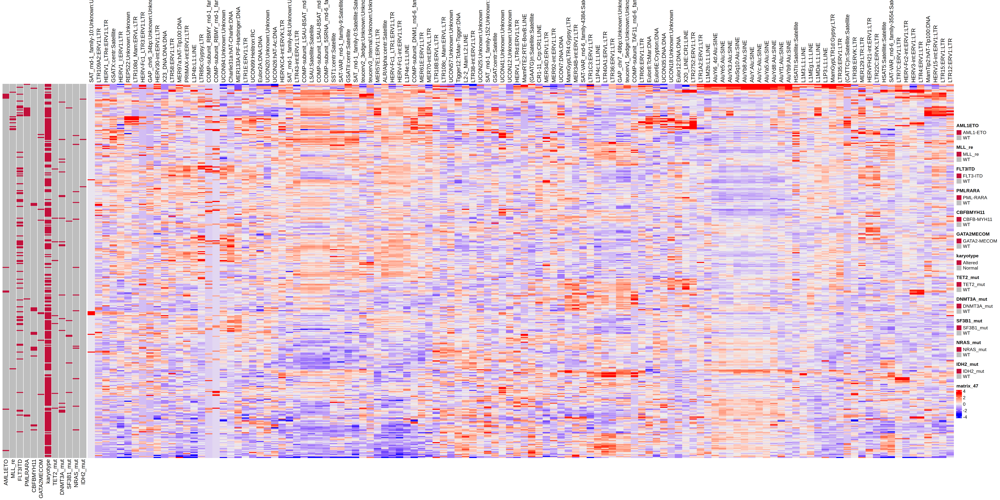

In [267]:
rn_sel = unique(deg_mut_dt[FDR < 0.1 & abs(logFC) > 1, rn])
plotdat = logcpm_beat_te[rn_sel, rownames(dsn_df)]
plotdat = scale_fun(plotdat)
mut_sel = c('AML1ETO',  'MLL_re',  'FLT3ITD',  'PMLRARA',  'CBFBMYH11',  'GATA2MECOM', 'karyotype')
gene_mut = paste0(c('TET2', 'DNMT3A', 'SF3B1', 'NRAS', 'IDH2'), '_mut')
#column_ha = HeatmapAnnotation(df = dsn_df[, c(mut_sel, gene_mut)])
row_ha = rowAnnotation(df = dsn_df[, c(mut_sel, gene_mut)], 
                       col = list(AML1ETO = c('WT' = 'grey', 'AML1-ETO' = '#C10F3A'),
                                  MLL_re  = c('WT' = 'grey', 'MLL_re'   = '#C10F3A'),
                                  FLT3ITD = c('WT' = 'grey', 'FLT3-ITD'   = '#C10F3A'), 
                                  CBFBMYH11 = c('WT' = 'grey', 'CBFB-MYH11'   = '#C10F3A'),
                                  GATA2MECOM = c('WT' = 'grey', 'GATA2-MECOM'   = '#C10F3A'),
                                  PMLRARA = c('WT' = 'grey', 'PML-RARA'   = '#C10F3A'),
                                  karyotype = c('Normal' = 'grey', 'Altered'   = '#C10F3A'),
                                  TET2_mut = c('WT' = 'grey', 'TET2_mut'   = '#C10F3A'),
                                  DNMT3A_mut = c('WT' = 'grey', 'DNMT3A_mut'   = '#C10F3A'),
                                  SF3B1_mut = c('WT' = 'grey', 'SF3B1_mut'   = '#C10F3A'),
                                  NRAS_mut = c('WT' = 'grey', 'NRAS_mut'   = '#C10F3A'),
                                  IDH2_mut = c('WT' = 'grey', 'IDH2_mut'   = '#C10F3A')
                                 ))
options(repr.plot.width = 30, repr.plot.height = 15, repr.plot.res = 250)
#Heatmap(t(plotdat), top_annotation = column_ha, row_names_gp = grid::gpar(fontsize = 7), show_row_names = T, show_column_names = F, show_column_dend = F, show_row_dend = F)
Heatmap(t(plotdat), left_annotation = row_ha, row_names_gp = grid::gpar(fontsize = 9), show_row_names = F, show_column_names = T, 
        show_column_dend = F, show_row_dend = F, column_names_side = 'top')


In [45]:
dsn_df$group = dsn_df$FLT3ITD
deg_te_flt3itd = deg_fun('WT', 'FLT3-ITD', dsn_df, count_df_te, if_cpm = T)
logcpm_deg_te_flt3itd = deg_te_flt3itd[[2]]
deg_te_flt3itd = deg_te_flt3itd[[1]]
head(deg_te_flt3itd)


rn,logFC,logCPM,PValue,FDR
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Charlie31a:hAT-Charlie:DNA,1.2205151,7.5652691,3.782802e-16,4.955471e-13
GSAT:centr:Satellite,1.5397224,0.3324116,7.777793e-16,5.094455e-13
LTR33A_v:ERVL:LTR,0.5911217,8.1352381,9.934955e-14,4.338264e-11
HERV-Fc2-int:ERV1:LTR,-1.9905639,8.4630227,6.632486e-11,2.172139e-08
HERV15-int:ERV1:LTR,0.9989653,8.1866454,1.226929e-08,3.214555e-06
LTR36:ERV1:LTR,-0.9815219,7.2302871,2.274285e-08,4.965521e-06


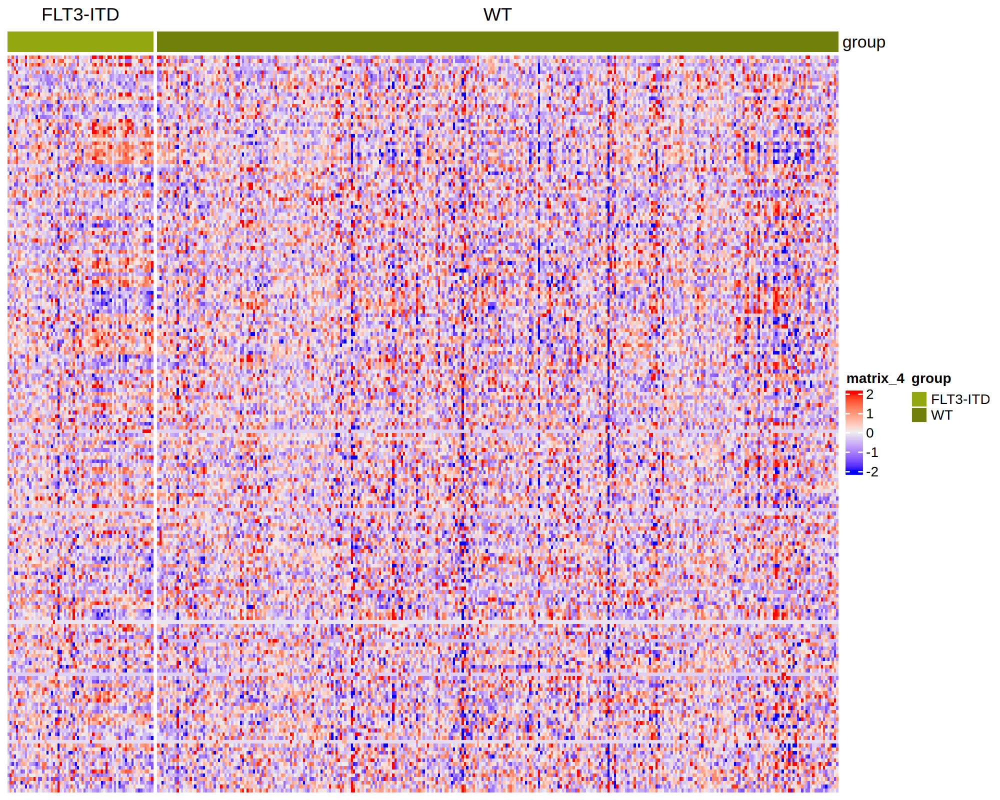

In [71]:
options(repr.plot.width = 10, repr.plot.height = 8, repr.plot.res = 200)
heatmap_fun(logcpm_deg_te_flt3itd, dsn_df, deg_te_flt3itd, show_row_names = F)

In [69]:
tmp = list(a=1, b=2)
tmp
c(tmp, a=3)
list(tmp, a=3)

$a
[1] 1

$b
[1] 2

$a
[1] 1

$b
[1] 2

$a
[1] 3

[[1]]
[[1]]$a
[1] 1

[[1]]$b
[1] 2


$a
[1] 3

In [1]:
ls()

character(0)

In [ ]:
options(repr.plot.width = ncol(plotdat) * unit(5, 'mm'), repr.plot.height = nrow(plotdat) * unit(5, 'mm'), repr.plot.res = 200)
hp

ERROR: Error in Cairo::Cairo(width, height, tf, "png", pointsize, bg, "transparent", : Failed to create Cairo backend!


ERROR: Error in eval(expr, envir, enclos): object 'dsn_df' not found


In [28]:
logcpm_deg_te_flt3itd

ERROR: Error in eval(expr, envir, enclos): object 'logcpm_deg_te_flt3itd' not found


In [30]:
ls()

[1] "add_ann"            "aml_genes"          "base_dir"          
 [4] "coding_genes"       "count_df"           "count_df_coding"   
 [7] "count_df_te"        "count_dt"           "count_list"        
[10] "cpm_fun"            "cut_quantile"       "data_dir"          
[13] "deg_fun"            "deg_local_fun"      "deg_telocal_fun"   
[16] "dge"                "dsn"                "dsn_sel"           
[19] "head2"              "logcpm_3cohorts_t"  "logcpm_beat_coding"
[22] "logcpm_beat_t"      "logcpm_beat_te"     "pathway_fun"       
[25] "PP"                 "scale_fun"          "tail2"             
[28] "telocal_dt"         "telocal_list"       "tmp"               
[31] "txdb"

In [287]:
deg_te_dnmt3a = deg_fun('WT', 'DNMT3A_mut', dsn_sel_df, count_df_te, if_cpm = T)


In [289]:
head(deg_te_dnmt3a[[1]])

rn,logFC,logCPM,PValue,FDR
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
SAT_rnd-1_family-152:Unknown:Unknown,4.1349143,2.546314,1.348128e-13,1.766048e-10
ERVL-int:ERVL:LTR,0.5634708,7.323699,8.355040e-05,5.472551e-02
Tigger8:TcMar-Tigger:DNA,0.2997231,8.024739,7.653334e-04,3.341956e-01
LTR75_1:ERV1:LTR,-0.6100929,4.802873,4.627500e-03,9.932995e-01
HERV-Fc2-int:ERV1:LTR,-2.9667759,9.237230,6.599939e-03,9.932995e-01
LTR1C:ERV1:LTR,-0.3990580,3.418123,7.009829e-03,9.932995e-01


In [265]:
deg_fun

function (group1, group2, dsn, mtx, if_cpm = F) 
{
    group1_name = paste(group1, collapse = "_")
    group2_name = paste(group2, collapse = "_")
    dsn_sel = dsn[dsn$group %in% c(group1, group2), , drop = F]
    dsn_sel$group[dsn_sel$group %in% group1] = group1_name
    dsn_sel$group[dsn_sel$group %in% group2] = group2_name
    groups = factor(dsn_sel$group, levels = c(group1_name, group2_name))
    mtx_sel = mtx[, rownames(dsn_sel)]
    dge = DGEList(counts = mtx_sel, group = groups)
    dge <- calcNormFactors(dge)
    dge = normLibSizes(dge)
    design = model.matrix(~0 + groups)
    dge = estimateDisp(dge, design)
    et <- exactTest(dge)
    deg = topTags(et, n = nrow(mtx_sel))
    deg = as.data.table(deg$table, keep.rownames = T)
    if (if_cpm == T) {
        logcpm = cpm(dge, log = T)
        deg = list(deg = deg, logcpm = logcpm)
    }
    deg
}

In [ ]:
count_df_te

In [261]:
tail2(logcpm_beat_t)

teucerv1_5edge:Unknown:Unknown,teucerv2_3edge:Unknown:Unknown,teucerv3_internal:Unknown:Unknown,relapse_LTR_UP,CMP_dn_LTR_DNA,lvl
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
9.191442,6.413226,-0.06159675,-0.02520708,-0.14783536,low
8.284575,7.012904,-0.01837146,0.37121286,0.25099435,hi
5.401812,7.824462,0.60311330,-0.59817373,-0.21096334,low
8.550444,7.054691,1.21496140,-0.36407600,-0.02528668,low


In [ ]:
logcpm_beat_t$FLT3ITD
logcpm_beat_t$MLL_re
logcpm_beat_t$AML1ETO
logcpm_beat_t$DNMT3A_mut

# concensus clusterting

In [94]:
library(ConsensusClusterPlus)


In [103]:
aml_genes
aml_genes_mut = paste0(aml_genes, '_mut')
feat_sel = c(aml_genes_mut, 'MLL_re', 'FLT3ITD', 'AML1ETO', 'karyotype')


[1] "TET2"   "DNMT3A" "SF3B1"  "TP53"   "PPM1D"  "ASXL1"  "NRAS"   "JAK2"  
 [9] "GNB1"   "KRAS"   "CBL"    "IDH1"   "IDH2"

In [147]:
myPal = function(n=10){
  #returns n colors
  seq = rev(seq(0,255,by=255/(n)))
  palRGB = cbind(seq,seq,255)
  rgb(palRGB,maxColorValue=255)
}

In [ ]:
plotdat = scale_fun(logcpm_beat_te)
consensus_te = ConsensusClusterPlus(plotdat,maxK=15,reps=50,pItem=0.8,pFeature=1, title='BEATAML_te',clusterAlg="hc",distance="pearson",seed=1262118388.71279,plot="pdf")


In [190]:
length(consensus_te)

[1] 15

[1] 381 380

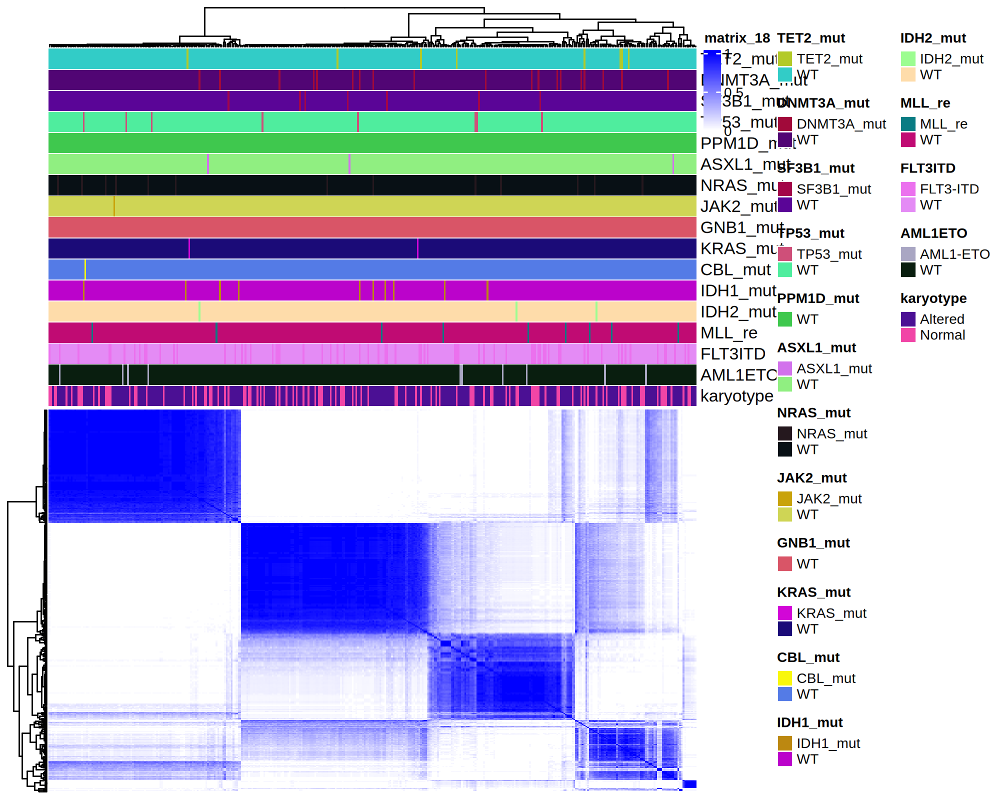

In [195]:
tk = 6
c = consensus_te[[tk]]$consensusMatrix
hc = consensus_te[[tk]]$consensusTree
ct = consensus_te[[tk]]$consensusClass
pc = c[hc$order, ]
#res[[tk]] = list(consensusMatrix = c, consensusTree = hc, consensusClass = ct, ml = ml[[tk]], clrs = colorList)
pc = rbind(pc, 0)
dim(pc)
tmyPal = myPal(10)
clrs = consensus_te[[tk]]$clrs
column_ha = HeatmapAnnotation(df = dsn_df[, feat_sel, drop = F])
Heatmap(pc, col = tmyPal, top_annotation = column_ha)
#heatmap(pc, Colv = as.dendrogram(hc), Rowv = NA,  symm = FALSE, scale = "none", col = tmyPal, na.rm = TRUE, 
#            labRow = F, labCol = F, mar = c(5, 5), main = paste("consensus matrix k=",  tk, sep = ""), ColSideCol = clrs[[1]])


In [177]:
tmyPal

[1] "#FFFFFF" "#E5E5FF" "#CCCCFF" "#B2B2FF" "#9999FF" "#7F7FFF" "#6666FF"
 [8] "#4C4CFF" "#3333FF" "#1919FF" "#0000FF"

In [171]:
head(pc)

0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


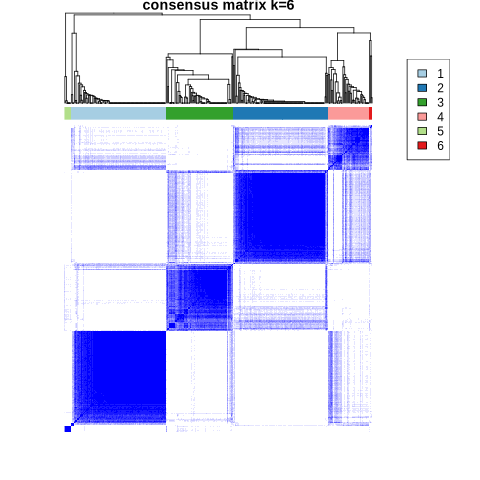

In [164]:
display_png(file = 'BEATAML_te/consensus006.png')

In [194]:
file.exists('BEATAML_te/consensus.pdf')
getwd()

[1] TRUE

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml"

In [ ]:
/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml/BEATAML_te/consensus.pdf

In [170]:
table(ct)

ct
  1   2   3   4   5   6 
372   3   1   1   2   1 

In [ ]:
consensus_coding = ConsensusClusterPlus(logcpm_beat_coding,maxK=6,reps=50,pItem=0.8,pFeature=1, title='BEATAML_coding',clusterAlg="hc",distance="pearson",seed=1262118388.71279,plot="png")

[](BEATAML_te//consensus001.png)

In [ ]:
icl = calcICL(results,title=title,plot="png")
 icl[["clusterConsensus"]]

# export 

In [ ]:
saveRDS(count_df, file = 'count_d.rds')

In [ ]:
saveRDS(logcpm_beataml_telocal, file = 'logcpm_beataml_telocal.rds') 
saveRDS(telocal_df, file = 'telocal_df.rds') 

In [ ]:
saveRDS(count_df_coding, file = 'count_df_coding.rds')
saveRDS(logcpm_beat_coding, file = 'logcpm_beat_coding.rds')

saveRDS(count_df_te, file = 'count_df_te.rds')
saveRDS(logcpm_beat_te, file = 'logcpm_beat_te.rds')


In [7]:
count_df_coding = readRDS(file = 'count_df_coding.rds')
logcpm_beat_coding  = readRDS(file = 'logcpm_beat_coding.rds')

count_df_te = readRDS(file = 'count_df_te.rds')
logcpm_beat_te = readRDS(file = 'logcpm_beat_te.rds')


Warning message in gzfile(file, "rb"):
"cannot open compressed file 'count_df_coding.rds', probable reason 'No such file or directory'"


ERROR: Error in gzfile(file, "rb"): cannot open the connection


In [39]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/dataset/beataml"

In [37]:
fwrite(dsn, file = 'beataml_dsn_15Jul.tsv')
fwrite(dsn_sel, file = 'beataml_dsn_sel_15Jul.tsv')

In [ ]:
fwrite(dsn_clin_sel_df, file = 'dsn_clin_sel_df.tsv')

In [2]:
dsn = fread('beataml_dsn_15Jul.tsv')

ERROR: Error in fread("beataml_dsn_15Jul.tsv"): could not find function "fread"


In [55]:
colnames(beat_clin)

[1] "dbgap_subject_id"                         
  [2] "dbgap_dnaseq_sample"                      
  [3] "dbgap_rnaseq_sample"                      
  [4] "cohort"                                   
  [5] "used_manuscript_analyses"                 
  [6] "manuscript_dnaseq"                        
  [7] "manuscript_rnaseq"                        
  [8] "manuscript_inhibitor"                     
  [9] "consensus_sex"                            
 [10] "inferred_sex"                             
 [11] "reportedRace"                             
 [12] "reportedEthnicity"                        
 [13] "inferred_ethnicity"                       
 [14] "centerID"                                 
 [15] "CEBPA_Biallelic"                          
 [16] "consensusAMLFusions"                      
 [17] "ageAtDiagnosis"                           
 [18] "isRelapse"                                
 [19] "isDenovo"                                 
 [20] "isTransformed"                            
 [21] "specificDxAtAcquisition_MDSMPN"           
 [22] "nonAML_MDSMPN_specificDxAtAcquisition"    
 [23] "priorMalignancyNonMyeloid"                
 [24] "priorMalignancyType"                      
 [25] "cumulativeChemo"                          
 [26] "priorMalignancyRadiationTx"               
 [27] "priorMDS"                                 
 [28] "priorMDSMoreThanTwoMths"                  
 [29] "priorMDSMPN"                              
 [30] "priorMDSMPNMoreThanTwoMths"               
 [31] "priorMPN"                                 
 [32] "priorMPNMoreThanTwoMths"                  
 [33] "dxAtInclusion"                            
 [34] "specificDxAtInclusion"                    
 [35] "ELN2017"                                  
 [36] "dxAtSpecimenAcquisition"                  
 [37] "specificDxAtAcquisition"                  
 [38] "ageAtSpecimenAcquisition"                 
 [39] "timeOfSampleCollectionRelativeToInclusion"
 [40] "specimenGroups"                           
 [41] "diseaseStageAtSpecimenCollection"         
 [42] "specimenType"                             
 [43] "rnaSeq"                                   
 [44] "exomeSeq"                                 
 [45] "totalDrug"                                
 [46] "analysisRnaSeq"                           
 [47] "analysisExomeSeq"                         
 [48] "analysisDrug"                             
 [49] "cumulativeTreatmentTypeCount"             
 [50] "cumulativeTreatmentTypes"                 
 [51] "cumulativeTreatmentRegimenCount"          
 [52] "cumulativeTreatmentRegimens"              
 [53] "cumulativeTreatmentStageCount"            
 [54] "cumulativeTreatmentStages"                
 [55] "responseToInductionTx"                    
 [56] "typeInductionTx"                          
 [57] "responseDurationToInductionTx"            
 [58] "mostRecentTreatmentType"                  
 [59] "currentRegimen"                           
 [60] "currentStage"                             
 [61] "mostRecentTreatmentDuration"              
 [62] "vitalStatus"                              
 [63] "overallSurvival"                          
 [64] "causeOfDeath"                             
 [65] "%.Basophils.in.PB"                        
 [66] "%.Blasts.in.BM"                           
 [67] "%.Blasts.in.PB"                           
 [68] "%.Eosinophils.in.PB"                      
 [69] "%.Immature.Granulocytes.in.PB"            
 [70] "%.Lymphocytes.in.PB"                      
 [71] "%.Monocytes.in.PB"                        
 [72] "%.Neutrophils.in.PB"                      
 [73] "%.Nucleated.RBCs.in.PB"                   
 [74] "ALT"                                      
 [75] "AST"                                      
 [76] "albumin"                                  
 [77] "creatinine"                               
 [78] "fabBlastMorphology"                       
 [79] "hematocrit"                               
 [80] "hemoglobin"                               
 [

In [1]:
dim(dsn)


ERROR: Error in eval(expr, envir, enclos): object 'dsn' not found
